 ## 🐶 Using Transfer Learning and TensorFlow  to Classify Different Dog Breeds
Who's that doggy in the window?

Dogs are incredible. But have you ever been sitting at a cafe, seen a dog and not known what breed it is? I have. And then someone says, "it's an English Terrier" and you think, how did they know that?

In this project we're going to be using machine learning to help us identify different breeds of dogs.

To do this, we'll be using data from the Kaggle dog breed identification competition. It consists of a collection of 10,000+ labelled images of 120 different dog breeds.

This kind of problem is called multi-class image classification. It's multi-class because we're trying to classify mutliple different breeds of dog. If we were only trying to classify dogs versus cats, it would be called binary classification (one thing versus another).

Multi-class image classification is an important problem because it's the same kind of technology Tesla uses in their self-driving cars or Airbnb uses in atuomatically adding information to their listings.

Since the most important step in a deep learng problem is getting the data ready (turning it into numbers), that's what we're going to start with.

We're going to go through the following TensorFlow/Deep Learning workflow:

1. Get data ready (download from Kaggle, store, import).
2. Prepare the data (preprocessing, the 3 sets, X & y).
3. Choose and fit/train a model (TensorFlow Hub, tf.keras.applications, TensorBoard, EarlyStopping).
4. Evaluating a model (making predictions, comparing them with the ground truth labels).
5. Improve the model through experimentation (start with 1000 images, make sure it works, increase the number of images).
6. Save, sharing and reloading your model (once you're happy with the results).
7. For preprocessing our data, we're going to use TensorFlow 2.x. The whole premise here is to get our data into Tensors (arrays of numbers which can be run on GPUs) and then allow a machine learning model to find patterns between them.

For our machine learning model, we're going to be using a pretrained deep learning model from TensorFlow Hub.

The process of using a pretrained model and adapting it to your own problem is called transfer learning. We do this because rather than train our own model from scratch (could be timely and expensive), we leverage the patterns of another model which has been trained to classify images.

In [ ]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d 'drive/MyDrive/Dog Vision/'

## Get Our workspace ready

In [1]:
# import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF version: ',tf.__version__)
print('TF-hub version: ',hub.__version__)

#check fot gpu availability
print('GPU','available ' if tf.config.list_physical_devices('GPU') else 'not available ')

TF version:  2.18.0
TF-hub version:  0.16.1
GPU available 


## Geting out data ready
turing our data into numerical format

In [2]:
import pandas as pd
labels_csv = pd.read_csv('drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

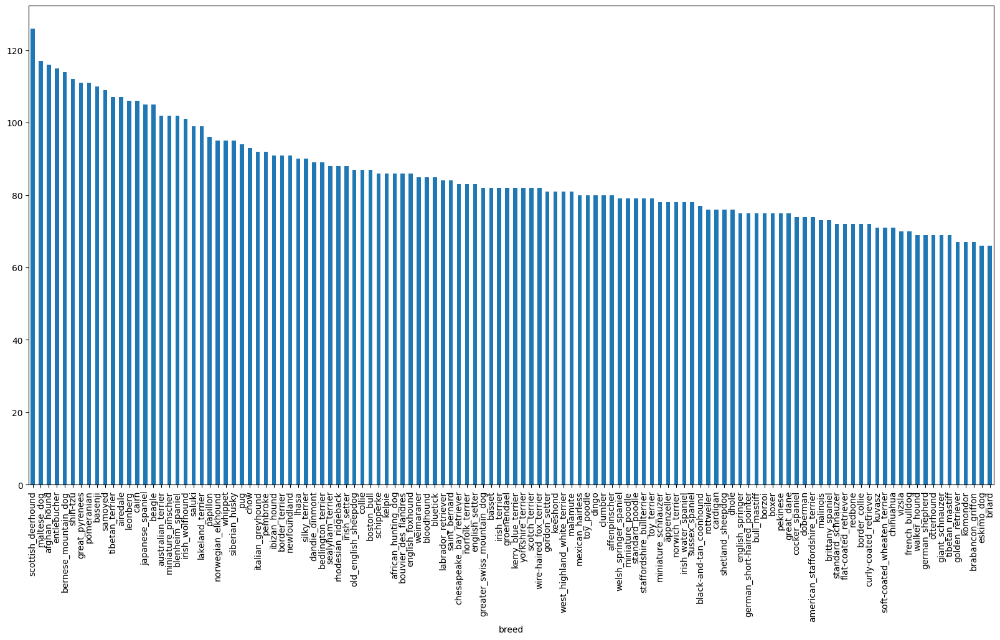

In [3]:
labels_csv['breed'].value_counts().plot.bar(figsize = (20,10))

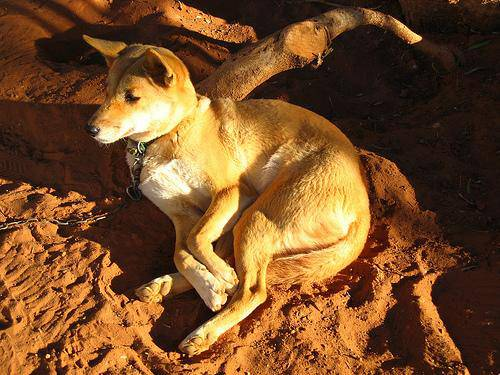

In [4]:
# import images
from IPython.display import Image
Image('drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

# Getting images and their labels
lets get a list of all our image file pathnames

In [5]:
# pathnames for image id's

filename = ['drive/MyDrive/Dog Vision/train/' + fname + '.jpg' for fname in labels_csv['id']]

filename[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [6]:
# check whether no of files matches of actual image files
import os
if len(os.listdir('drive/MyDrive/Dog Vision/train/'))== len(filename):
  print('ok')
else:
  print('not ok')

ok


In [7]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [8]:
# check if no of labels is equa to filenames
if len(labels) == len(filename):
  print('ok')
else:
  print('not ok')

ok


In [9]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [10]:
# turn  a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [11]:
# turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [12]:
len(boolean_labels)

10222

In [13]:
# example: turning boolean array into int
print(labels[0]) #original index
print(np.where(unique_breeds==labels[0])) # index where label occures
print(boolean_labels[0].argmax()) # index where label occures in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occure

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [14]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [15]:
X = filename
y = boolean_labels

## Creating Validation Set


In [16]:
# SET NO OF IMAGES TO USE FOR EXPERIMENTATION
NUM_IMAGES = 1000 #@param {type:'slider', min:1000,max:10000}

In [17]:
# Lets split the data into train and validation set
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

## Preprocessing Images(turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpeg file) into Tensors.
4. Convert the color channel values from 0-255 to 0-1 values
5. Resize the `image` to be of shape (224, 224).
6. Return the modified `image`.

In [18]:
IMG_SIZE = 224

# CREATE a function for prepossing images

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn jpeg img into numerical tensor with 3 colour channels
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224,224)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

## Turning our data into batches


In [19]:
# Create  a simple function to return a tuple(image,label)

def get_img_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image,label).
  """
  image = process_image(image_path)
  return image,label

In [20]:
(process_image(X[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [21]:
# Define a batch size, 32 is good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset , we probably dont have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print('Creating training data batches...')
    #turn filepath and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    # Shuffing pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image,label) tuples (This also turns the image path into a preprocessed image)
    data = data.map(get_img_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch



In [22]:
# traning and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [23]:
# differnt attributes of out data batches

train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing dataset

In [24]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

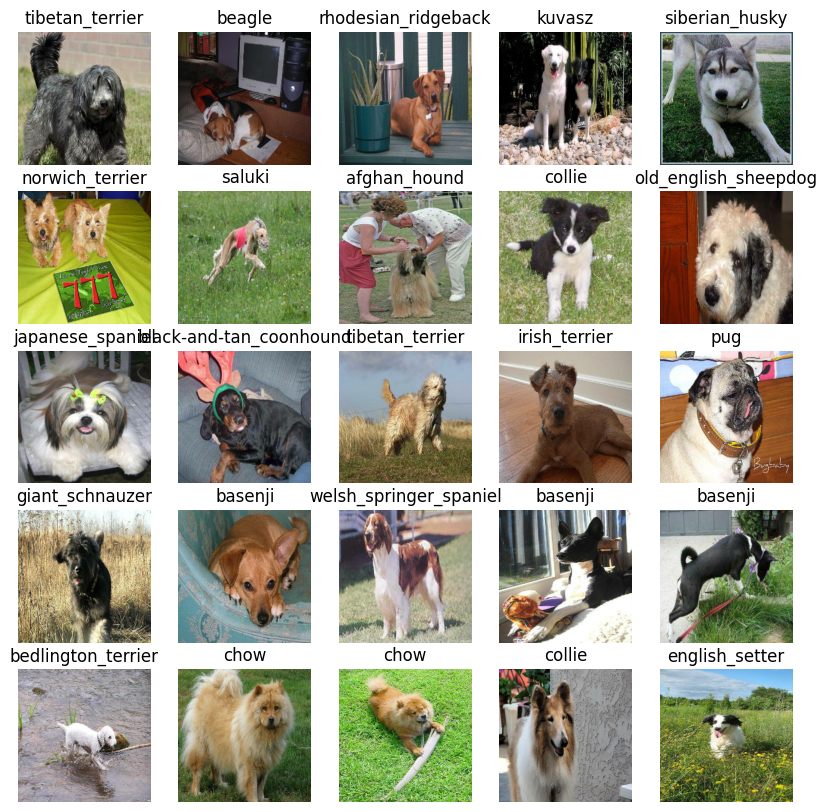

In [25]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

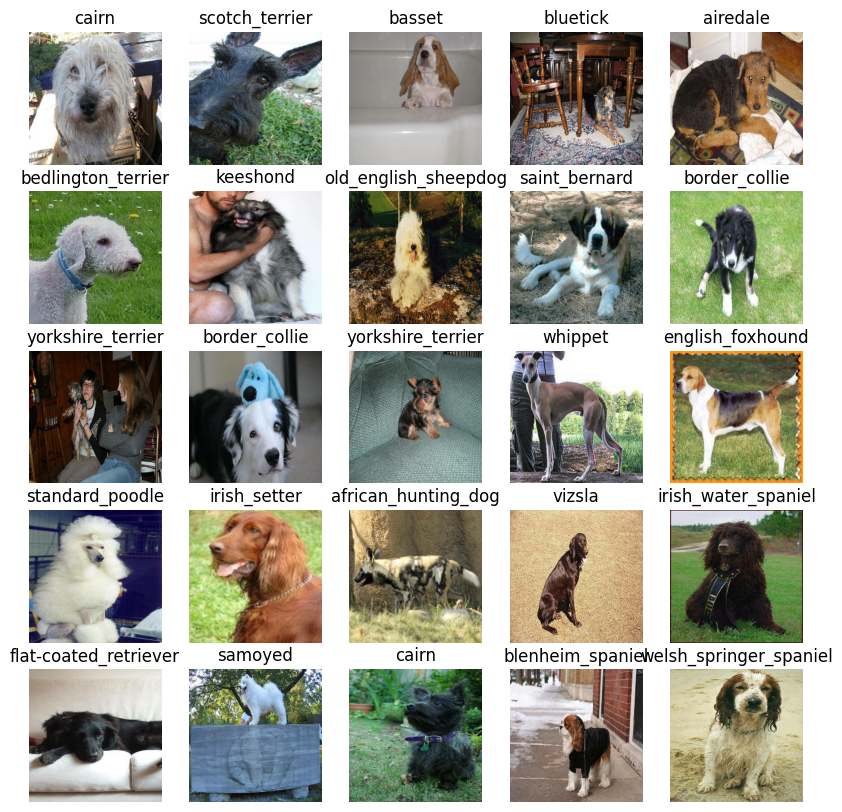

In [26]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

# Creating and training model


In [27]:
# setup input shape to model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

#Setup output shape of our model

OUTPUT_SHAPE = len(unique_breeds)

# SETUP MODE url from tensorflow hub
MODEL_URL = 'https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1'

In [28]:
# create a function that buids keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
   # setup the model layers
   model = tf_keras.Sequential([
       hub.KerasLayer(MODEL_URL),#lAYER 1 (INPUT LAYER)
       tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                             activation='softmax') # Layer 2 (output layer)
    ])

   # Compile the model

   model.compile(
       loss=tf_keras.losses.CategoricalCrossentropy(),
       optimizer=tf_keras.optimizers.Adam(),
       metrics=['accuracy']
   )

   # Build the model

   model.build(INPUT_SHAPE)

   return model



In [29]:
import tf_keras
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

The two callbacks we're going to add are a TensorBoard callback and an Early Stopping callback.

In [30]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [31]:
import datetime

#create a function to build a TensorBoard callbacks
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive/MyDrive/Dog Vision/logs',
                        #Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early Stoping Callbacks


In [32]:
#create a early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor='val_accuracy',
                                                  patience=3)

## Training a model (on subset of data)

In [33]:
NUM_EPOCHS = 100 #@param {type:'slider',min:10,max:100}

In [34]:
#Build a function to train and return a trained model
def train_model():

  # create model
  model = create_model()

  # Create new tensorboard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #return model
  return model

In [35]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 165s 6s/step - loss: 4.5787 - accuracy: 0.1125 - val_loss: 3.2925 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 4s 159ms/step - loss: 1.6607 - accuracy: 0.6662 - val_loss: 2.0270 - val_accuracy: 0.5600
Epoch 3/100
25/25 [==============================] - 4s 156ms/step - loss: 0.5741 - accuracy: 0.9413 - val_loss: 1.5329 - val_accuracy: 0.6400
Epoch 4/100
25/25 [==============================] - 3s 130ms/step - loss: 0.2523 - accuracy: 0.9875 - val_loss: 1.3683 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 5s 201ms/step - loss: 0.1437 - accuracy: 0.9975 - val_loss: 1.3086 - val_accuracy: 0.6800
Epoch 6/100
25/25 [==============================] - 4s 153ms/step - loss: 0.0995 - accuracy: 1.0000 - val_loss: 1.2704 - val_accuracy: 0.6950
Epoch 7/100
25/25 [==============================] - 3s 126ms/step - loss: 0.0747 - accuracy: 1.0000 - val_loss: 1.2371 - val_accuracy: 0.7050


## Checking the tensorBoard logs

In [36]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [37]:
#make predictions on the validation data
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 152ms/step


array([[1.43257121e-03, 8.57609484e-05, 1.17418636e-03, ...,
        1.87533980e-04, 6.35520482e-05, 4.14385134e-03],
       [1.05960201e-03, 2.27422360e-03, 1.38884075e-02, ...,
        4.42620134e-04, 3.57067864e-03, 2.02584546e-04],
       [1.47935876e-04, 1.11609304e-04, 1.20376244e-04, ...,
        6.32650801e-04, 9.31146133e-05, 2.57484638e-03],
       ...,
       [4.84928432e-06, 6.89909793e-05, 1.62602548e-04, ...,
        3.33207136e-05, 5.86645656e-05, 1.14318049e-04],
       [3.91095225e-03, 5.34140738e-04, 7.18414158e-05, ...,
        2.37425455e-04, 6.98245931e-05, 4.42099012e-03],
       [5.99951833e-04, 7.54169196e-06, 2.27397238e-03, ...,
        3.76249966e-03, 8.78863386e-04, 3.16671561e-04]], dtype=float32)

In [38]:
predictions.shape

(200, 120)

In [39]:
# first prediction
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[6.22198932e-05 7.72657877e-05 2.09261125e-05 2.07974117e-05
 2.57570320e-03 6.77348871e-05 2.85257611e-05 6.71839691e-04
 1.31774729e-03 4.81296107e-02 6.69338115e-05 6.79968389e-06
 2.53957260e-04 3.53877293e-03 7.10954075e-04 2.89044902e-03
 6.54671112e-06 3.42426327e-04 2.11889128e-04 1.84196018e-04
 3.65043197e-05 1.32271743e-04 3.16108417e-05 1.04253377e-04
 3.07443808e-03 7.69512044e-05 1.18100412e-04 1.07784734e-04
 7.05390048e-05 8.87546994e-05 4.08253873e-05 1.34374844e-04
 1.47322653e-05 3.34381111e-05 3.56743767e-05 3.86387001e-05
 6.97531141e-05 4.33580775e-04 4.41563279e-05 3.97023112e-01
 3.85808489e-05 1.63147051e-05 8.48547730e-04 5.64043239e-06
 4.23902151e-04 4.48368919e-05 3.63390864e-05 3.30763287e-04
 4.01811049e-05 5.04070078e-04 2.03799482e-05 1.06375912e-04
 1.81981653e-04 1.47303985e-03 2.08092151e-05 2.20343092e-04
 2.33306127e-04 1.89685215e-05 2.81882913e-05 9.33771480e-06
 1.59677202e-05 2.74015008e-04 1.00332036e-05 5.52105230e-05
 5.80489868e-05 1.978914

In [40]:
#Turning prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

In [41]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [42]:


images_ = []
labels_ = []
#loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [43]:
#create a function to unbatch the batch dataset
def unbatchify(data):
  images = []
  labels = []
  #loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels
# unbatchify the vallidation data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [44]:
def plot_preds(prediction_probabilities,labels,images,n=1):
  '''
  View the prediction ,ground truth and image for sample n
  '''
  pred_prob, true_label,image = prediction_probabilities[n],labels[n],images[n]

  #get the pred label
  pred_label = get_pred_label(pred_prob)

  #plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'

  #Change plot title to be predictied probability of prediction and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
            color = color )

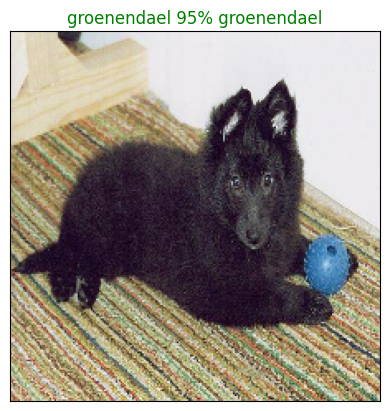

In [45]:
plot_preds(prediction_probabilities=predictions,
           labels=val_labels,
           images=val_images,
           n=77)

In [46]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  '''
  plus the top 10 prediction confidences along with the truth label for sample n
  '''
  pred_prob,true_label = prediction_probabilities[n],labels[n]

  #get the pred label
  pred_label = get_pred_label(pred_prob)

  #find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #setup the plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation='vertical')

  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

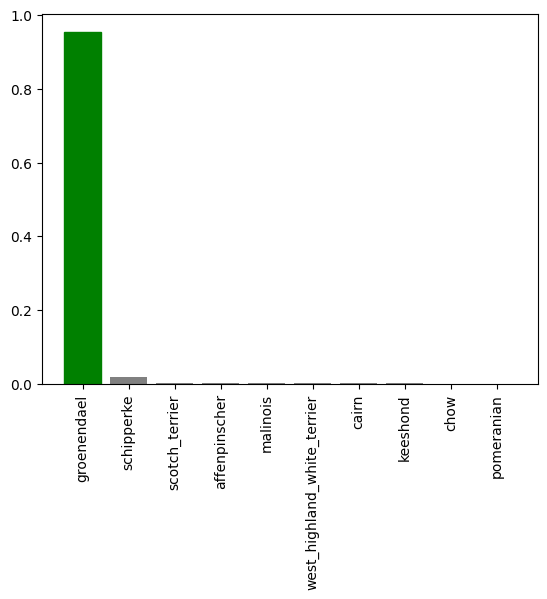

In [47]:
plot_pred_conf(prediction_probabilities= predictions,
               labels = val_labels,
               n=77)

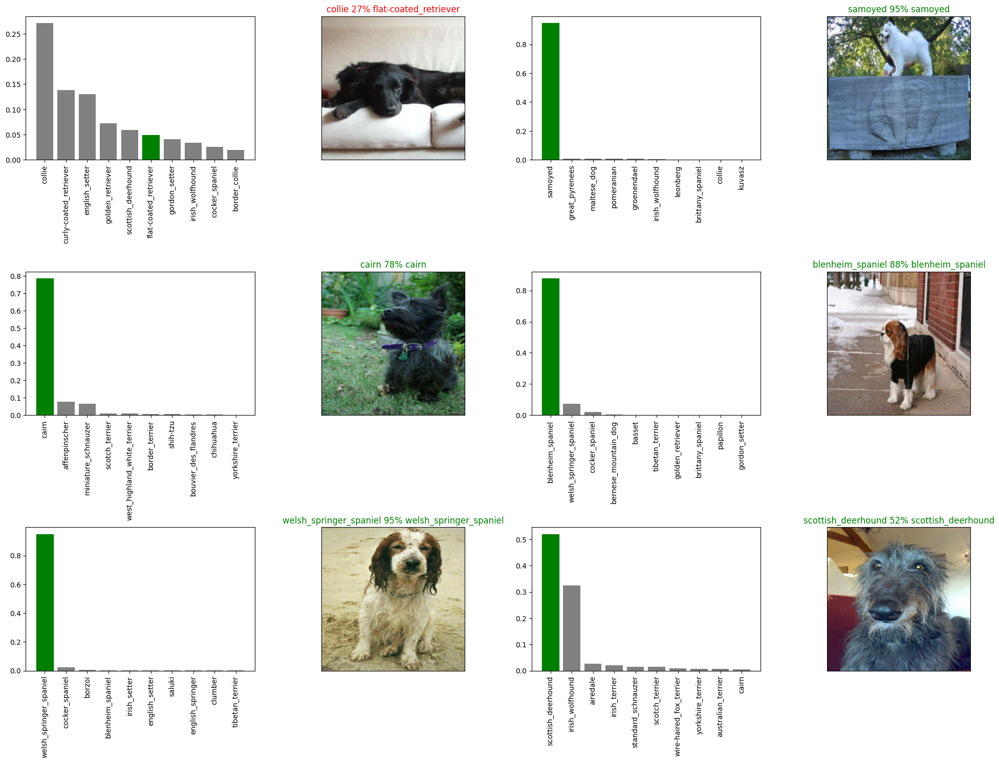

In [48]:
#let check out a few predictions and their differnt values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n= i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_preds(prediction_probabilities=predictions,
             labels=val_labels,
             images=val_images,
             n= i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

In [49]:
def save_model(model,suffix=None):
  '''
  saves a given model in a models directory and appends a suffix
  '''
  modeldir = os.path.join('drive/MyDrive/Dog Vision/models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  model_path = modeldir + '-' + suffix + '.h5'
  print(f'Saving model to:{model_path}...')
  model.save(model_path)
  return model_path

In [60]:
def load_model(model_path):
  print(f'Loading saved model from: {model_path}')
  model = tf_keras.models.load_model(model_path,
                                    custom_objects={'KerasLayer':hub.KerasLayer})
  return model

In [51]:
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to:drive/MyDrive/Dog Vision/models/20250531-115017-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250531-115017-1000-images-mobilenetv2-Adam.h5'


## Training  our model on full data




In [52]:
len(X),len(y)

(10222, 10222)

In [53]:
#create a data batch with full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [54]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [55]:
#create a model for full model
full_model = create_model()

In [56]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience = 3)

In [57]:
#Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 45s 122ms/step - loss: 1.3491 - accuracy: 0.6659
Epoch 2/100
320/320 [==============================] - 37s 117ms/step - loss: 0.3980 - accuracy: 0.8797
Epoch 3/100
320/320 [==============================] - 36s 113ms/step - loss: 0.2368 - accuracy: 0.9360
Epoch 4/100
320/320 [==============================] - 40s 124ms/step - loss: 0.1511 - accuracy: 0.9639
Epoch 5/100
320/320 [==============================] - 36s 112ms/step - loss: 0.1074 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0779 - accuracy: 0.9850
Epoch 7/100
320/320 [==============================] - 37s 116ms/step - loss: 0.0579 - accuracy: 0.9926
Epoch 8/100
320/320 [==============================] - 38s 117ms/step - loss: 0.0457 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0389 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 37s 114m

In [58]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to:drive/MyDrive/Dog Vision/models/20250531-120843-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20250531-120843-full-image-set-mobilenetv2-Adam.h5'

In [61]:
# load the full model
loaded_full_model = load_model('drive/MyDrive/Dog Vision/models/20250531-120843-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Vision/models/20250531-120843-full-image-set-mobilenetv2-Adam.h5


##Making prediction on test dataset

In [62]:
#Load test image filenames
test_path = 'drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e0bf90705facb623a6f36046cc495659.jpg',
 'drive/MyDrive/Dog Vision/test/df58b248e14af15c43fb4a3ebc00e9a3.jpg',
 'drive/MyDrive/Dog Vision/test/e402619cf0a1766811068db0dd42fbae.jpg',
 'drive/MyDrive/Dog Vision/test/e5de4eec61d00ee4834ff0153f90ed41.jpg',
 'drive/MyDrive/Dog Vision/test/dea5b2d047b3cb7ce13234140c7bf5aa.jpg',
 'drive/MyDrive/Dog Vision/test/e22db0abd7c039726b9683fc0a372204.jpg',
 'drive/MyDrive/Dog Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 'drive/MyDrive/Dog Vision/test/e3cfadb2543190f43da6bb5500c75578.jpg',
 'drive/MyDrive/Dog Vision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 'drive/MyDrive/Dog Vision/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg']

In [63]:
len(test_filenames)

10357

In [64]:
#create test databatch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [65]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [67]:
#make prediction on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 1552s 5s/step


In [68]:
np.savetxt('drive/MyDrive/Dog Vision/preds_array.csv',test_predictions,delimiter=',')

In [69]:
test_predictions[:10]

array([[1.2911545e-07, 5.2761902e-08, 1.6296719e-08, ..., 1.5247223e-06,
        3.4373482e-10, 7.6594869e-10],
       [9.5387334e-01, 1.9813172e-10, 4.0148066e-08, ..., 9.1035089e-11,
        2.6255438e-07, 4.1906629e-02],
       [4.4901975e-09, 2.3212009e-11, 1.2240860e-10, ..., 3.4617670e-11,
        5.8488123e-08, 1.8321576e-09],
       ...,
       [2.4604781e-06, 7.4532347e-10, 1.0751421e-06, ..., 1.8837847e-08,
        2.5522692e-07, 2.6463408e-03],
       [1.3282877e-06, 1.9795838e-05, 1.0985050e-06, ..., 1.0784092e-06,
        5.9703322e-09, 9.4274804e-07],
       [1.2693555e-11, 2.1717396e-12, 4.8085591e-11, ..., 3.8038515e-09,
        1.0640476e-06, 1.5861477e-08]], dtype=float32)

In [70]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

In [71]:
preds_df = pd.DataFrame(columns=['id']+ list(unique_breeds))

In [72]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [73]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0bf90705facb623a6f36046cc495659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,df58b248e14af15c43fb4a3ebc00e9a3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e402619cf0a1766811068db0dd42fbae,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5de4eec61d00ee4834ff0153f90ed41,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dea5b2d047b3cb7ce13234140c7bf5aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0bf90705facb623a6f36046cc495659,1.291154e-07,5.276190e-08,1.629672e-08,1.891482e-10,8.681038e-07,2.902776e-06,2.157289e-12,1.202955e-07,8.720680e-08,...,4.695299e-07,7.327564e-06,1.352760e-08,2.118901e-06,1.615122e-08,1.357864e-10,4.772556e-11,1.524722e-06,3.437348e-10,7.659487e-10
1,df58b248e14af15c43fb4a3ebc00e9a3,9.538733e-01,1.981317e-10,4.014807e-08,1.343480e-10,5.749672e-12,1.534435e-09,2.979053e-06,9.064784e-11,5.186130e-12,...,6.701118e-08,5.151571e-06,3.273221e-09,2.462975e-09,2.579789e-08,1.876432e-10,2.459860e-07,9.103509e-11,2.625544e-07,4.190663e-02
2,e402619cf0a1766811068db0dd42fbae,4.490198e-09,2.321201e-11,1.224086e-10,1.179688e-09,4.816310e-11,1.317167e-08,8.567376e-09,1.005916e-09,3.320507e-10,...,2.515784e-11,5.657051e-10,3.887303e-07,3.012527e-07,3.508963e-09,1.416714e-05,1.398488e-11,3.461767e-11,5.848812e-08,1.832158e-09
3,e5de4eec61d00ee4834ff0153f90ed41,1.321849e-12,1.503946e-04,1.618333e-10,1.808680e-09,6.817136e-11,1.395771e-10,3.167889e-10,1.153673e-10,1.576521e-13,...,1.534441e-10,7.279407e-13,4.499992e-12,2.571655e-11,2.087075e-11,1.032273e-11,2.705662e-14,6.574026e-09,4.001866e-11,1.829394e-08
4,dea5b2d047b3cb7ce13234140c7bf5aa,4.633291e-06,3.839166e-10,3.007720e-06,4.886777e-06,1.424473e-05,6.137657e-06,1.946509e-09,3.997393e-08,8.510937e-08,...,3.221539e-10,6.782062e-08,5.161204e-08,1.247939e-06,2.308480e-06,6.806093e-10,1.090883e-04,7.584761e-04,1.018260e-01,8.206280e-08


In [76]:
preds_df.to_csv('drive/MyDrive/Dog Vision/full_model_prediction_submission.csv',index=False)

In [81]:
#get test image prediction labels
test_pred_labels = [get_pred_label(test_predictions[i]) for i in range(len(test_predictions))]
test_pred_labels[:10]

['great_dane',
 'affenpinscher',
 'brittany_spaniel',
 'briard',
 'irish_wolfhound',
 'keeshond',
 'pug',
 'cairn',
 'scotch_terrier',
 'pembroke']

In [82]:
#get test images
test_images =[]
for image in test_data.unbatch().as_numpy_iterator():
  test_images.append(image)